# Using the Riemann metric to estimate dimensionality reduction distortion

Here, I'll show how we can use the [Riemann metric](https://arxiv.org/abs/1305.7255) to estimate the distortion introduced by dimensionality reduction. In particular, I'll show how this is of particular interest in the T CD4 subpopulations revealed by TopOMetry. Throghout this notebook, I'll also show how this closely relates to the concepts of intrinsic dimensionality (from a local perspective) and of manifold curvature.

In [30]:
import numpy as np
import pandas as pd
import scanpy as sc
import topo as tp
import celltometry as ct
import gseapy as gp
from scipy.sparse import csr_matrix

In [31]:
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline

In [32]:
wd = '/home/davi/Bioinfo/TopOMetry_Paper/FinalData/'

In [33]:
pbmc68k = sc.read_h5ad(wd + 'pbmc68k_paper_final_backup.h5ad')
pbmc68k

AnnData object with n_obs × n_vars = 66834 × 2318
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'db_diff_leiden', 'db_fuzzy_leiden', 'fb_diff_leiden', 'fb_fuzzy_leiden', 'pca_leiden'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'db_diff_leiden_colors', 'db_diff_leiden_dendro', 'db_diff_leiden_logreg', 'db_fuzzy_leiden_colors', 'dendrogram_db_diff_leiden', 'fb_diff_leiden_colors', 'fb_fuzzy_leiden_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'pca_leiden_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_PHATE', 'X_PaCMAP', 'X_TriMAP', 'X_UMAP_on_PCA', 'X_db', 'X_db_NCVis', 'X_db_PaCMAP', 'X_db_TriMAP', 'X_db_UMAP', 'X_db_diff_MAP', 'X_db_diff_MDE', 'X_db_fuzzy_MAP', 'X_db_fuzzy_MDE', 'X_db_tSNE', 'X_fb', 'X_fb_NCVis', 'X_fb_PaCMAP', 'X_fb_TriMAP', 'X_fb_diff_MA

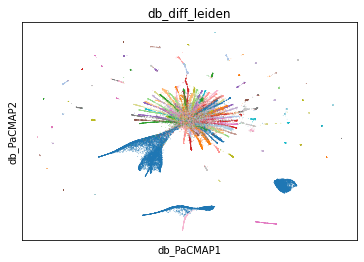

In [5]:
sc.pl.embedding(pbmc68k, basis = 'db_PaCMAP', color=['db_diff_leiden'], legend_loc=None, legend_fontsize=5)

In [34]:
tg = tp.read_pkl(wd=wd, filename='PBMC68k_TopOGraph_final.pkl')
tg

TopOGraph object with 66834 samples and 2318 observations and:
 . Orthogonal bases: 
 .. Multiscale Diffusion Maps fitted - .MSDiffMap 
    With similarity metrics stored at - .DiffBasis.K and .DiffBasis.T 
    With layouts: 
         PaCMAP - .db_PaCMAP 
         TriMAP - .db_TriMAP 
         tSNE - .db_tSNE 
         NCVis - .db_NCVis
     And the downstream topological graphs: 
       Diffusion graph - .db_diff_graph
          Graph layouts: 
         MAP - .db_diff_MAP 
         MDE - .db_diff_MDE 
       Fuzzy graph - .db_fuzzy_graph 
         Graph layouts: 
         MAP - .db_fuzzy_MAP 
         MDE - .db_fuzzy_MDE

 .. Fuzzy (simplicial sets) Laplacian Eigenmaps fitted - .FuzzyLapMap
    With similarity metrics stored at - .FuzzyBasis 
    With layouts: 
         PaCMAP - .fb_PaCMAP 
         TriMAP - .fb_TriMAP 
         tSNE - .fb_tSNE 
         NCVis - .fb_NCVis
     And the downstream topological graphs: 
      Diffusion graph - .fb_diff_graph 
        Graph layouts: 
     

Now we'll use the diffusion kernel stored at `tg.DiffBasis.K` to compute the geometric Laplacian:

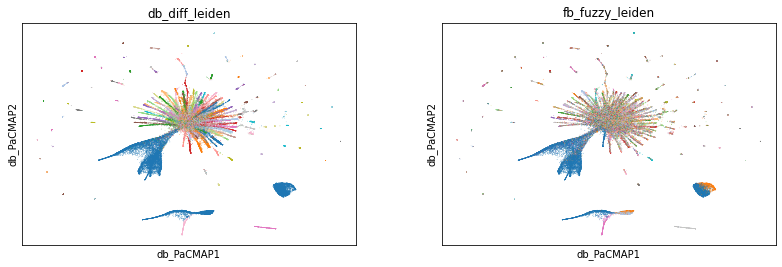

In [16]:
sc.pl.embedding(pbmc68k, basis='db_PaCMAP', color=['db_diff_leiden', 'fb_fuzzy_leiden'], legend_loc=None)

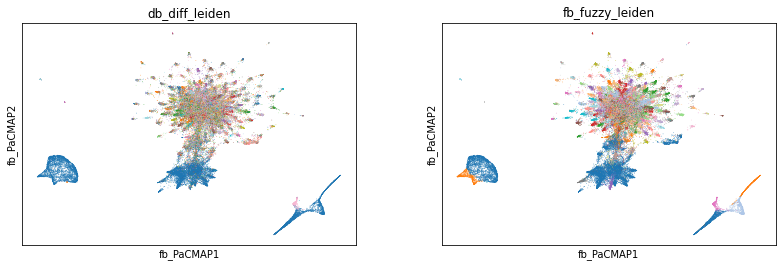

In [14]:
sc.pl.embedding(pbmc68k, basis='fb_PaCMAP', color=['db_diff_leiden', 'fb_fuzzy_leiden'], legend_loc=None)

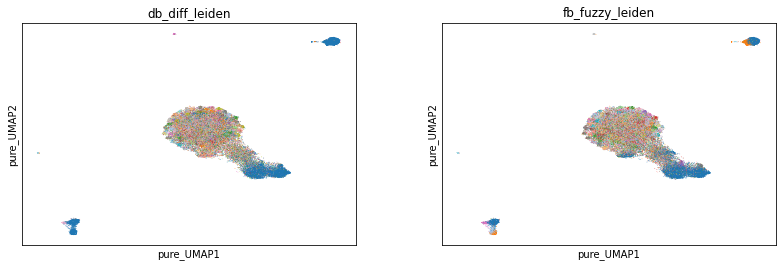

In [15]:
sc.pl.embedding(pbmc68k, basis='pure_UMAP', color=['db_diff_leiden', 'fb_fuzzy_leiden'], legend_loc=None)

In [28]:
from scipy.sparse.csgraph import laplacian

naive_laplacian = laplacian((tg.base_knn_graph + tg.base_knn_graph.T) / 2)
geom_laplacian = laplacian(tg.DiffBasis.K)

Next, we can use the geometric Laplacian to compute the Riemann metric across any embedding of our choice. Let's try it with the `tg.db_PaCMAP` and `tg.db_diff_MAP` embeddings!

The function we'll use is the `RiemannMetric` function. It can be acessed from the `topo.eval` module or separetely imported:
```
from topo.eval import RiemannMetric
```

In [8]:
rmetric_dbpacmap = tp.eval.RiemannMetric(tg.db_PaCMAP, geom_laplacian)
H_dbpacmap = rmetric_dbpacmap.get_dual_rmetric()

rmetric_dbpacmap = tp.eval.RiemannMetric(tg.db_diff_MAP, geom_laplacian)
H_dbdiffmap = rmetric_dbpacmap.get_dual_rmetric()

Finally, let's visualize our results!

/home/davi/.local/lib/python3.9/site-packages/topo/plot.py:362: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ellip = Ellipse(pos, width=width, height=height, angle=theta, **kwargs)
/home/davi/.local/lib/python3.9/site-packages/topo/plot.py:362: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ellip = Ellipse(pos, width=width, height=height, angle=theta, **kwargs)


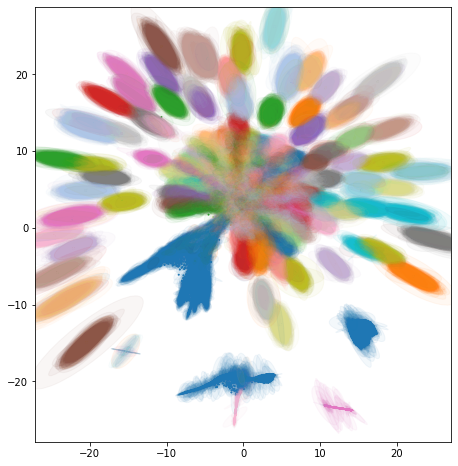

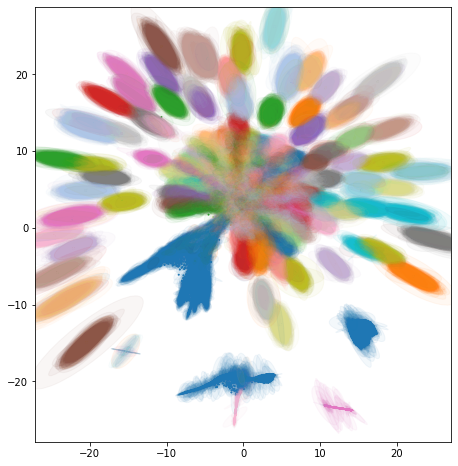

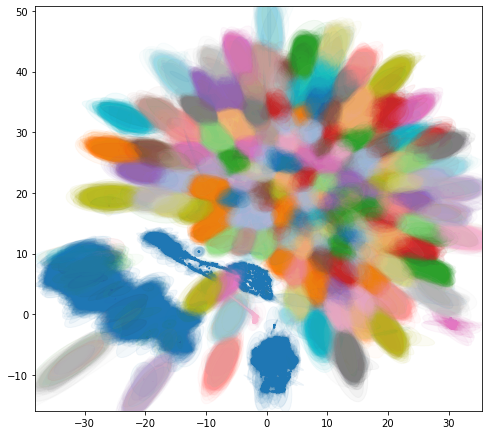

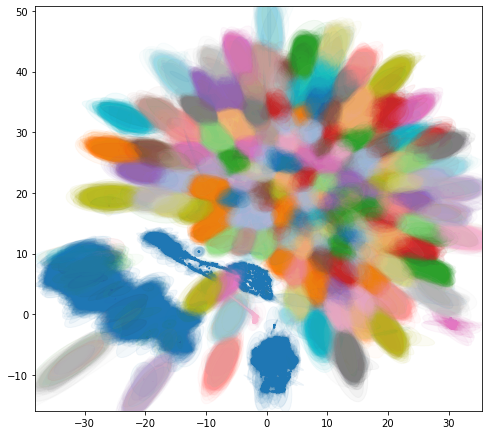

In [9]:
labels = pbmc68k.obs['db_diff_leiden'].astype(int)

tp.pl.plot_riemann_metric(emb=tg.db_PaCMAP, laplacian=geom_laplacian,
                          H_emb=H_dbpacmap, labels=labels,
                    cmap='tab20', n_plot=pbmc68k.n_obs, std=0.1, alpha=0.05)

tp.pl.plot_riemann_metric(emb=tg.db_diff_MAP, laplacian=geom_laplacian,
                          H_emb=H_dbdiffmap, labels=labels,
                    cmap='tab20', n_plot=pbmc68k.n_obs, std=0.1, alpha=0.05)

/home/davi/.local/lib/python3.9/site-packages/topo/plot.py:362: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ellip = Ellipse(pos, width=width, height=height, angle=theta, **kwargs)
/home/davi/.local/lib/python3.9/site-packages/topo/plot.py:362: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ellip = Ellipse(pos, width=width, height=height, angle=theta, **kwargs)


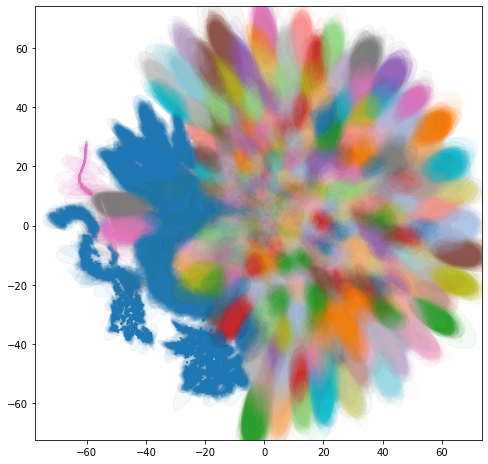

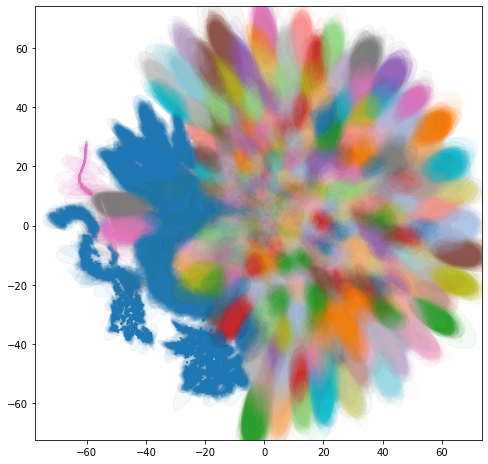

In [51]:
rmetric_dbtsne = tp.eval.RiemannMetric(tg.db_tSNE, geom_laplacian)
H_dbtsne = rmetric_dbtsne.get_dual_rmetric()

tp.pl.plot_riemann_metric(emb=tg.db_tSNE, laplacian=geom_laplacian,
                          H_emb=H_dbtsne, labels=labels,
                    cmap='tab20', n_plot=pbmc68k.n_obs, std=0.1, alpha=0.05)

If there was absolutely *no* distortion for a given data point (a cell), we would expect a uniform circle of null radius. Increasing radii represent increasing distortions. The more elongated the ellipses are, the more nonuniform the distortion is towards a direction (the ellipse larger axis be tilted towards the direction of the largest distortion). 

Now let's visualize how different embedding strategies distort the T cell submanifold. 

In [15]:
np.shape(pbmc68k.obsm['X_pca'][:,0])

(66834,)

(66834,)

/home/davi/.local/lib/python3.9/site-packages/topo/plot.py:362: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ellip = Ellipse(pos, width=width, height=height, angle=theta, **kwargs)
/home/davi/.local/lib/python3.9/site-packages/topo/plot.py:362: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ellip = Ellipse(pos, width=width, height=height, angle=theta, **kwargs)


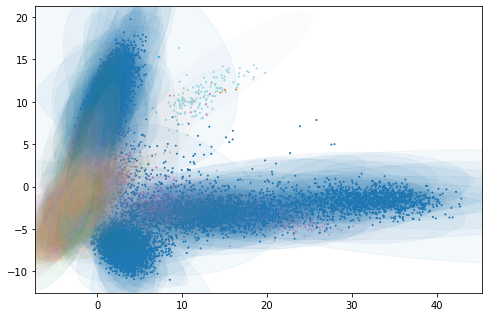

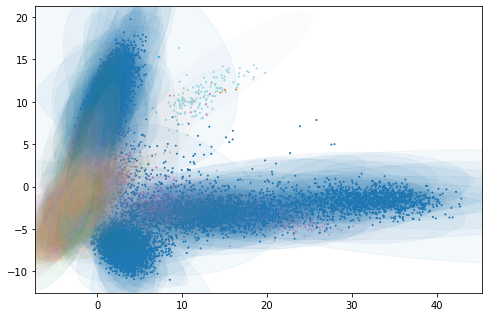

In [31]:
rmetric_pca = tp.eval.RiemannMetric(pbmc68k.obsm['X_pca'][:,0:2], naive_laplacian)
H_pca = rmetric_pca.get_dual_rmetric()
tp.pl.plot_riemann_metric(emb=pbmc68k.obsm['X_pca'][:,0:2], laplacian=naive_laplacian,
                          H_emb=H_pca, labels=labels,
                    cmap='tab20', n_plot=1000, std=1, alpha=0.05)

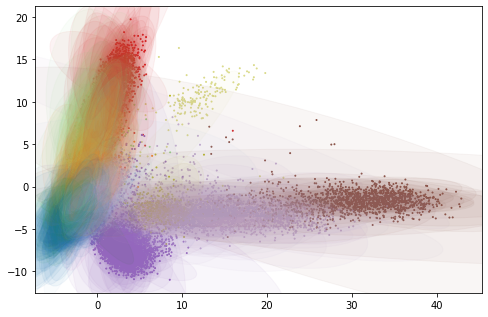

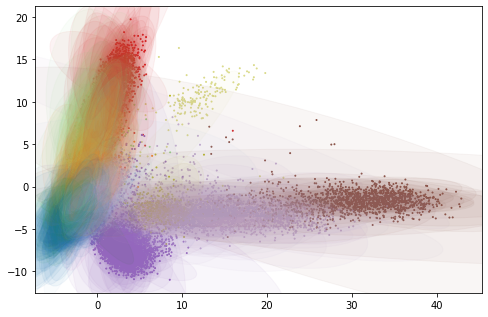

In [34]:
# Now color by PCA-graph clustering (standard scanpy) 
tp.pl.plot_riemann_metric(emb=pbmc68k.obsm['X_pca'][:,0:2], laplacian=naive_laplacian,
                          H_emb=H_pca, labels=pbmc68k.obs['pca_leiden'].astype(int),
                    cmap='tab20', n_plot=1000, std=1, alpha=0.05)

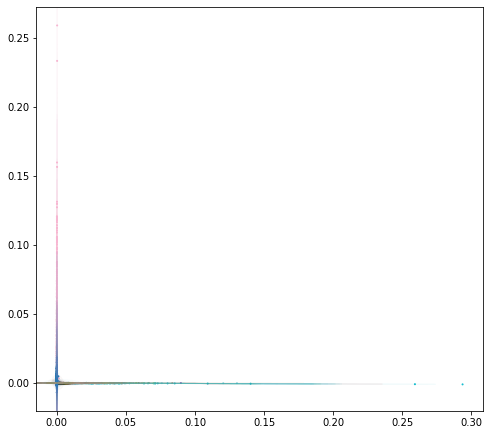

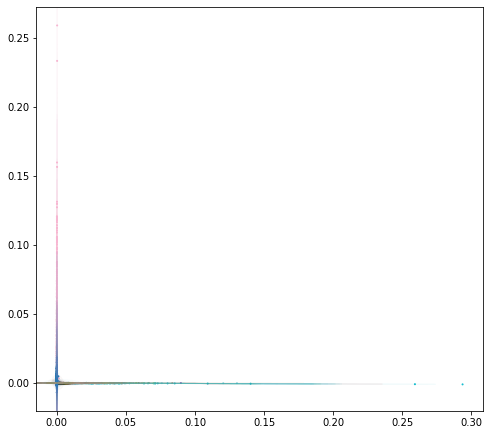

In [37]:
rmetric_db = tp.eval.RiemannMetric(tg.MSDiffMap[:,0:2], naive_laplacian)
H_db = rmetric_db.get_dual_rmetric()
tp.pl.plot_riemann_metric(emb=tg.MSDiffMap[:,0:2], laplacian=naive_laplacian,
                          H_emb=H_db, labels=labels,
                    cmap='tab20', n_plot=5000, std=1, alpha=0.05)

Now compare to other layout algorithms:

In [39]:
pbmc68k

AnnData object with n_obs × n_vars = 66834 × 2318
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'db_diff_leiden', 'db_fuzzy_leiden', 'fb_diff_leiden', 'fb_fuzzy_leiden', 'pca_leiden'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'db_diff_leiden_colors', 'db_diff_leiden_dendro', 'db_diff_leiden_logreg', 'db_fuzzy_leiden_colors', 'dendrogram_db_diff_leiden', 'fb_diff_leiden_colors', 'fb_fuzzy_leiden_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'pca_leiden_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_PHATE', 'X_PaCMAP', 'X_TriMAP', 'X_UMAP_on_PCA', 'X_db', 'X_db_NCVis', 'X_db_PaCMAP', 'X_db_TriMAP', 'X_db_UMAP', 'X_db_diff_MAP', 'X_db_diff_MDE', 'X_db_fuzzy_MAP', 'X_db_fuzzy_MDE', 'X_db_tSNE', 'X_fb', 'X_fb_NCVis', 'X_fb_PaCMAP', 'X_fb_TriMAP', 'X_fb_diff_MA

AnnData object with n_obs × n_vars = 66834 × 2318
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'db_diff_leiden', 'db_fuzzy_leiden', 'fb_diff_leiden', 'fb_fuzzy_leiden', 'pca_leiden'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'db_diff_leiden_colors', 'db_diff_leiden_dendro', 'db_diff_leiden_logreg', 'db_fuzzy_leiden_colors', 'dendrogram_db_diff_leiden', 'fb_diff_leiden_colors', 'fb_fuzzy_leiden_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'pca_leiden_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_PHATE', 'X_PaCMAP', 'X_TriMAP', 'X_UMAP_on_PCA', 'X_db', 'X_db_NCVis', 'X_db_PaCMAP', 'X_db_TriMAP', 'X_db_UMAP', 'X_db_diff_MAP', 'X_db_diff_MDE', 'X_db_fuzzy_MAP', 'X_db_fuzzy_MDE', 'X_db_tSNE', 'X_fb', 'X_fb_NCVis', 'X_fb_PaCMAP', 'X_fb_TriMAP', 'X_fb_diff_MA

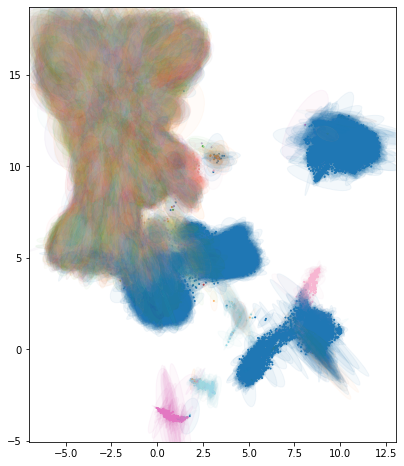

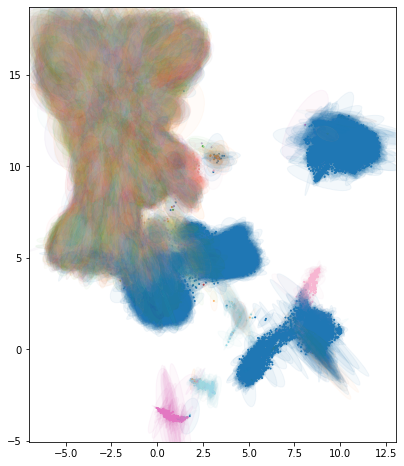

In [43]:
# UMAP on PCA
rmetric_umap_on_pca_geom = tp.eval.RiemannMetric(pbmc68k.obsm['X_pca_UMAP'], geom_laplacian)
H_umap_on_pca_geom = rmetric_umap_on_pca.get_dual_rmetric()

tp.pl.plot_riemann_metric(emb=pbmc68k.obsm['X_pca_UMAP'], laplacian=geom_laplacian,
                          H_emb=H_umap_on_pca_geom, labels=labels,
                    cmap='tab20', n_plot=pbmc68k.n_obs, std=0.1, alpha=0.05)

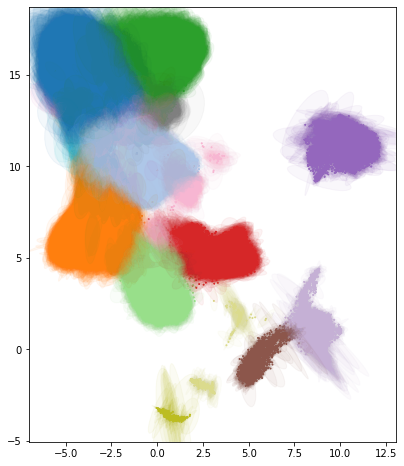

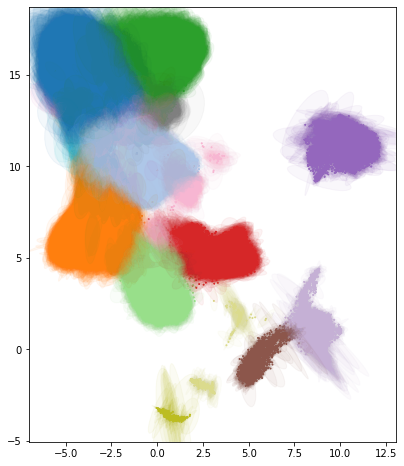

In [45]:
# Now with PCA-graph clustering colors
tp.pl.plot_riemann_metric(emb=pbmc68k.obsm['X_pca_UMAP'], laplacian=geom_laplacian,
                          H_emb=H_umap_on_pca_geom, labels=pbmc68k.obs['pca_leiden'].astype(int),
                    cmap='tab20', n_plot=pbmc68k.n_obs, std=0.1, alpha=0.05)

/home/davi/.local/lib/python3.9/site-packages/topo/plot.py:362: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ellip = Ellipse(pos, width=width, height=height, angle=theta, **kwargs)
/home/davi/.local/lib/python3.9/site-packages/topo/plot.py:362: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ellip = Ellipse(pos, width=width, height=height, angle=theta, **kwargs)


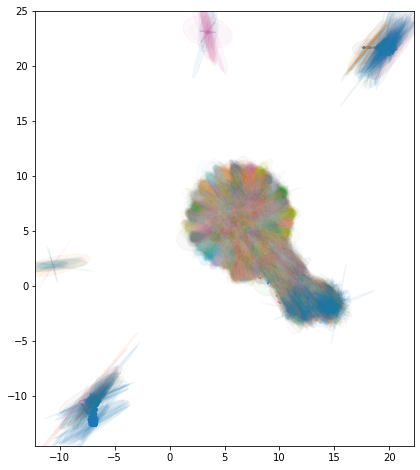

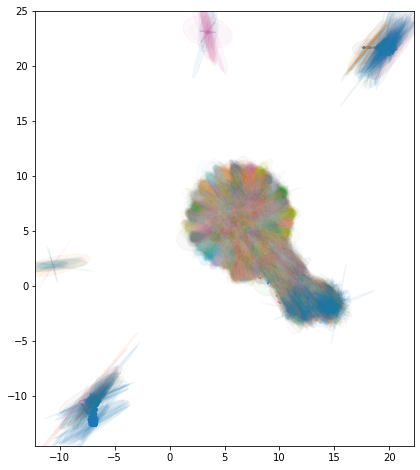

In [47]:
# Pure UMAP - naive laplacian
rmetric_pure_umap_naive = tp.eval.RiemannMetric(pbmc68k.obsm['X_pure_UMAP'], naive_laplacian)
H_pure_umap_naive = rmetric_pure_umap_naive.get_dual_rmetric()

tp.pl.plot_riemann_metric(emb=pbmc68k.obsm['X_pure_UMAP'], laplacian=naive_laplacian,
                          H_emb=H_pure_umap_naive, labels=labels,
                    cmap='tab20', n_plot=pbmc68k.n_obs, std=0.1, alpha=0.05)

/home/davi/.local/lib/python3.9/site-packages/topo/plot.py:362: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ellip = Ellipse(pos, width=width, height=height, angle=theta, **kwargs)
/home/davi/.local/lib/python3.9/site-packages/topo/plot.py:362: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ellip = Ellipse(pos, width=width, height=height, angle=theta, **kwargs)


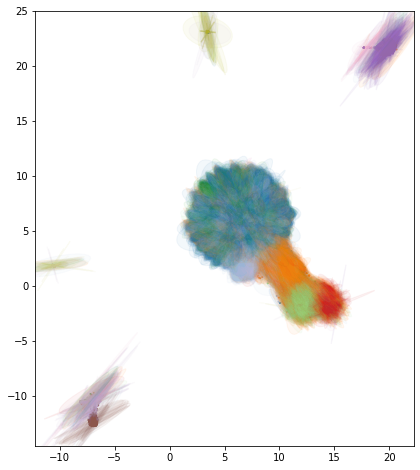

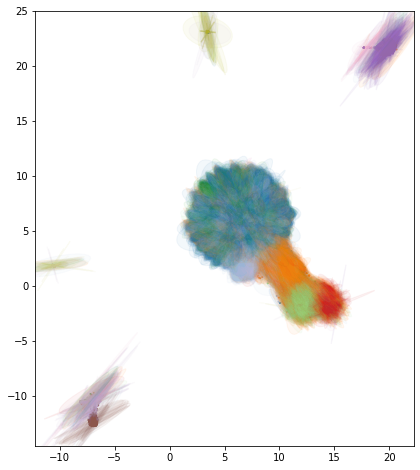

In [50]:
# Pure UMAP
rmetric_pure_umap = tp.eval.RiemannMetric(pbmc68k.obsm['X_pure_UMAP'], naive_laplacian)
H_pure_umap = rmetric_pure_umap.get_dual_rmetric()

tp.pl.plot_riemann_metric(emb=pbmc68k.obsm['X_pure_UMAP'], laplacian=naive_laplacian,
                          H_emb=H_pure_umap, labels=pbmc68k.obs['pca_leiden'].astype(int),
                    cmap='tab20', n_plot=pbmc68k.n_obs, std=0.1, alpha=0.05)

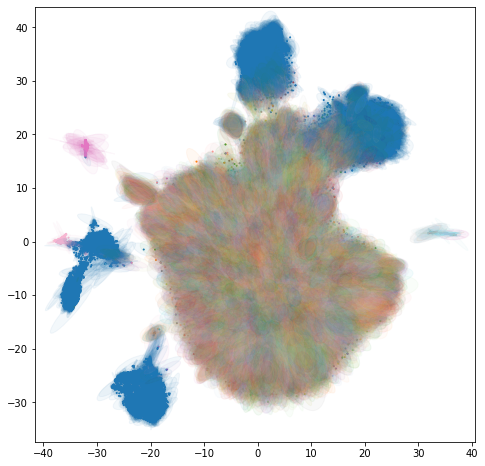

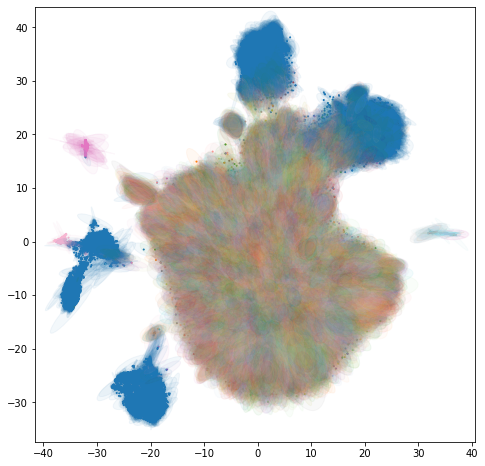

In [46]:
# tSNE on PCA
rmetric_tsne = tp.eval.RiemannMetric(pbmc68k.obsm['X_pca_tSNE'], geom_laplacian)
H_pure_tsne = rmetric_tsne.get_dual_rmetric()

tp.pl.plot_riemann_metric(emb=pbmc68k.obsm['X_pca_tSNE'], laplacian=geom_laplacian,
                          H_emb=H_pure_tsne, labels=labels,
                    cmap='tab20', n_plot=pbmc68k.n_obs, std=0.1, alpha=0.05)

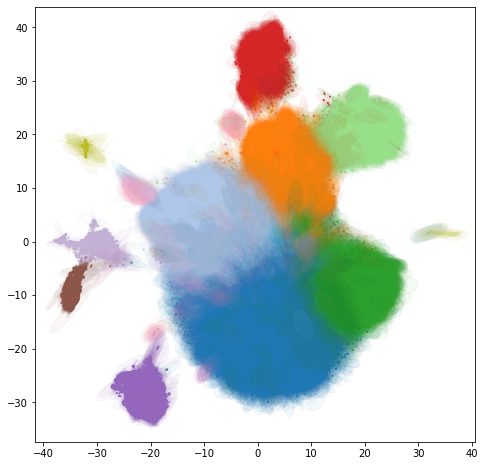

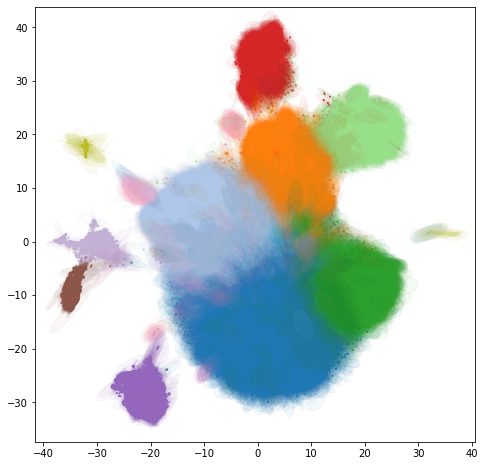

In [48]:
tp.pl.plot_riemann_metric(emb=pbmc68k.obsm['X_pca_tSNE'], laplacian=geom_laplacian,
                          H_emb=H_pure_tsne, labels=pbmc68k.obs['pca_leiden'].astype(int),
                    cmap='tab20', n_plot=pbmc68k.n_obs, std=0.1, alpha=0.05)

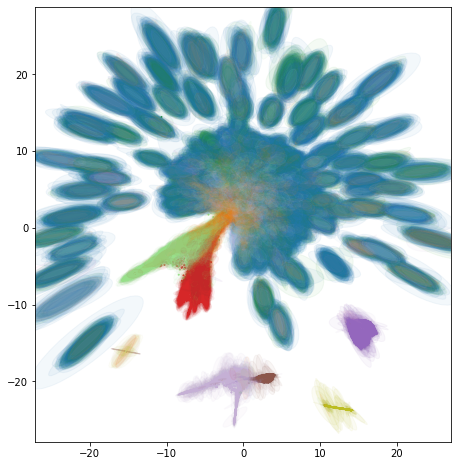

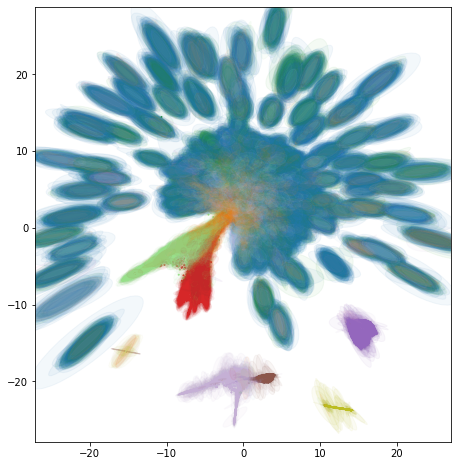

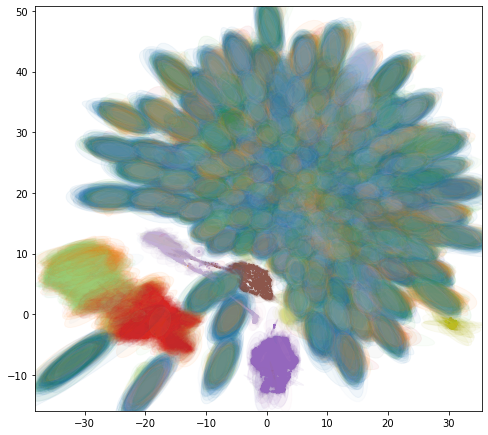

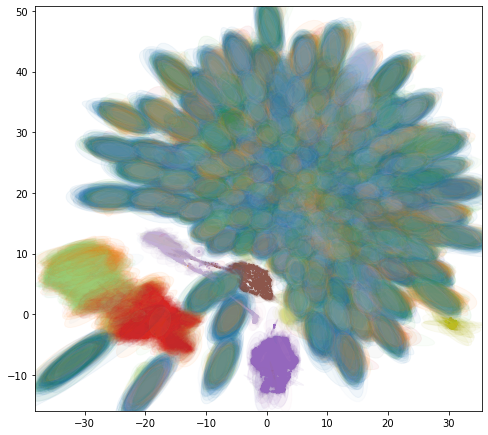

In [49]:
tp.pl.plot_riemann_metric(emb=tg.db_PaCMAP, laplacian=geom_laplacian,
                          H_emb=H_dbpacmap, labels=pbmc68k.obs['pca_leiden'].astype(int),
                    cmap='tab20', n_plot=pbmc68k.n_obs, std=0.1, alpha=0.05)

tp.pl.plot_riemann_metric(emb=tg.db_diff_MAP, laplacian=geom_laplacian,
                          H_emb=H_dbdiffmap, labels=pbmc68k.obs['pca_leiden'].astype(int),
                    cmap='tab20', n_plot=pbmc68k.n_obs, std=0.1, alpha=0.05)

In [54]:
np.shape(tg.DiffBasis.omega)

(66834,)

(66834,)

In [77]:
pbmc68k.obs['db_omega'] = tg.DiffBasis.omega
pbmc68k.obs['nbr_std_pre'] = tg.DiffBasis.adap_sd

In [75]:
tg.DiffBasis.omega

array([8.20928392, 7.9095867 , 8.12945545, ..., 8.59248438, 8.13764692,
       8.24444314])

array([8.20928392, 7.9095867 , 8.12945545, ..., 8.59248438, 8.13764692,
       8.24444314])

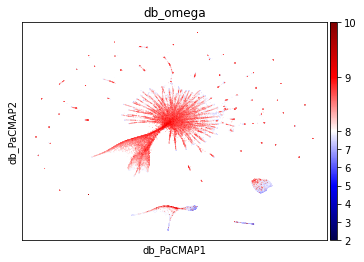

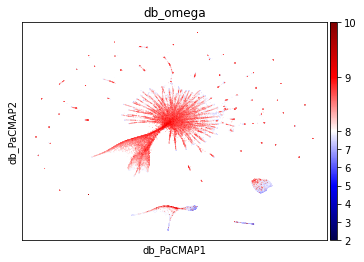

In [71]:
sc.pl.embedding(pbmc68k, basis='db_PaCMAP', color='db_omega', vcenter=8, color_map='seismic')

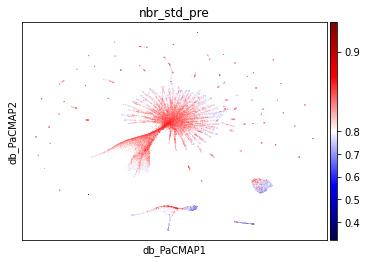

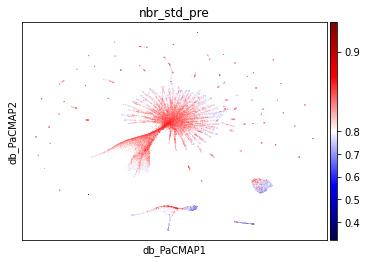

In [81]:
sc.pl.embedding(pbmc68k, basis='db_PaCMAP', color='nbr_std_pre', vcenter=0.8, color_map='seismic')

In [83]:
tg.FuzzyBasis

<66834x66834 sparse matrix of type '<class 'numpy.float32'>'
	with 1034138 stored elements in Compressed Sparse Row format>

<66834x66834 sparse matrix of type '<class 'numpy.float32'>'
	with 1034138 stored elements in Compressed Sparse Row format>

## New version

In [35]:
wdd = '/home/davi/Bioinfo/TopOMetry_Paper/'

adata = sc.read_h5ad(wdd + 'pbmc68k_new.h5ad')
tg_new = tp.read_pkl(wdd, 'topograph_pbmc68k_new.pkl')
adata

AnnData object with n_obs × n_vars = 66834 × 2318
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'db_diff_leiden', 'db_fuzzy_leiden', 'fb_diff_leiden', 'fb_fuzzy_leiden'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'fb_diff_leiden_logreg', 'hvg', 'leiden', 'log1p'
    obsm: 'X_db', 'X_db_PaCMAP', 'X_db_diff_MAP', 'X_db_fuzzy_MAP', 'X_fb', 'X_fb_PaCMAP', 'X_fb_diff_MAP', 'X_fb_fuzzy_MAP'

In [44]:
adata.obs['pca_leiden'] = pbmc68k.obs['pca_leiden']
adata.obs['db_diff_old'] = pbmc68k.obs['db_diff_leiden']
adata.obs['fb_diff_old'] = pbmc68k.obs['fb_diff_leiden']
adata.obs['db_fuzzy_old'] = pbmc68k.obs['db_fuzzy_leiden']
adata.obs['fb_fuzzy_old'] = pbmc68k.obs['fb_fuzzy_leiden']
adata.obsm['X_db_PaCMAP_old'] = pbmc68k.obsm['X_db_PaCMAP']
adata.obsm['X_fb_PaCMAP_old'] = pbmc68k.obsm['X_fb_PaCMAP']
adata.obsm['X_UMAP'] = pbmc68k.obsm['X_pure_UMAP']
adata.obsm['X_UMAP_on_PCA'] = pbmc68k.obsm['X_pca_umap']

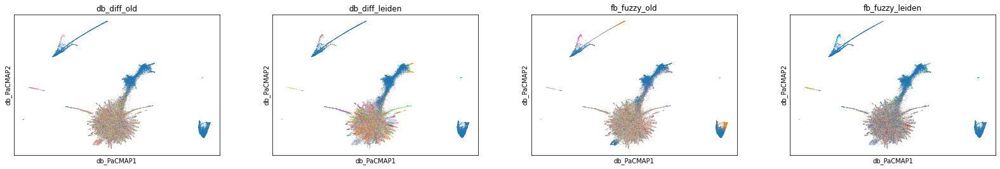

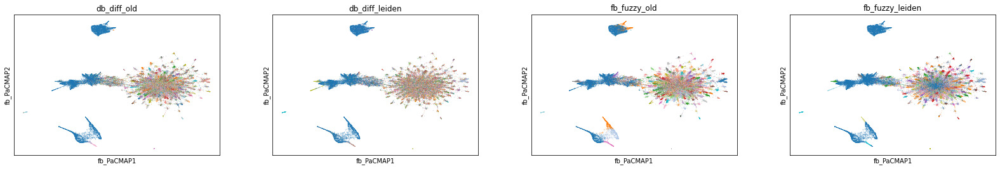

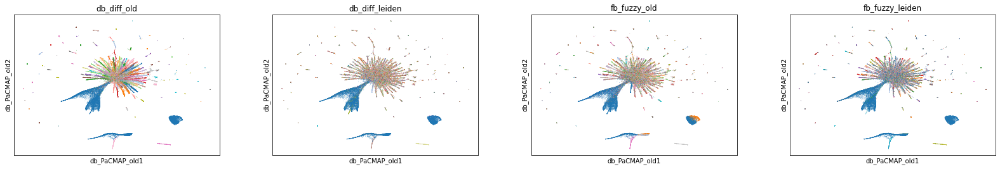

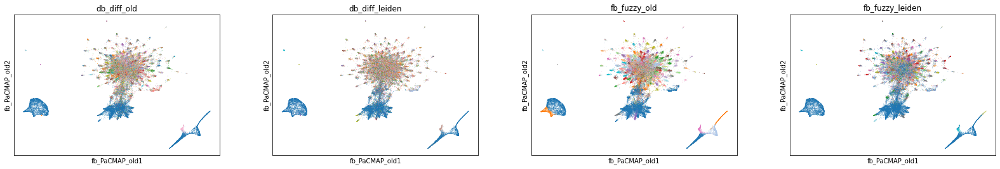

In [37]:
sc.pl.embedding(adata, basis='db_PaCMAP', color=['db_diff_old', 'db_diff_leiden', 'fb_fuzzy_old', 'fb_fuzzy_leiden'], legend_loc=None, ncols=4, palette='tab20') 
sc.pl.embedding(adata, basis='fb_PaCMAP', color=['db_diff_old', 'db_diff_leiden', 'fb_fuzzy_old', 'fb_fuzzy_leiden'], legend_loc=None, ncols=4, palette='tab20') 
sc.pl.embedding(adata, basis='db_PaCMAP_old', color=['db_diff_old', 'db_diff_leiden', 'fb_fuzzy_old', 'fb_fuzzy_leiden'], legend_loc=None, ncols=4, palette='tab20') 
sc.pl.embedding(adata, basis='fb_PaCMAP_old', color=['db_diff_old', 'db_diff_leiden', 'fb_fuzzy_old', 'fb_fuzzy_leiden'], legend_loc=None, ncols=4, palette='tab20') 


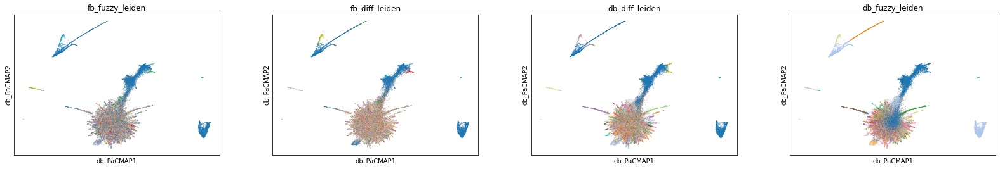

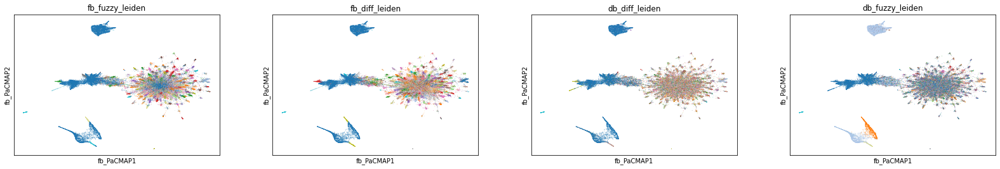

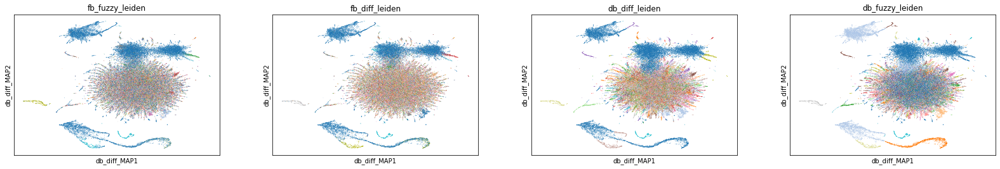

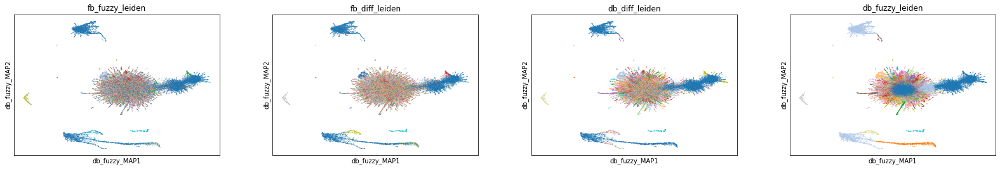

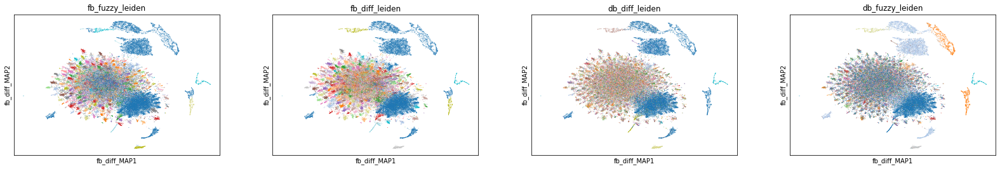

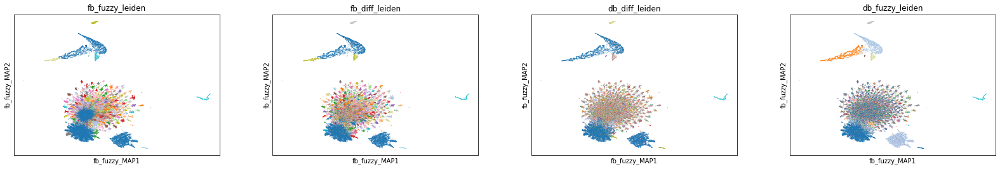

In [7]:
sc.pl.embedding(adata, basis='db_PaCMAP', color=['fb_fuzzy_leiden', 'fb_diff_leiden', 'db_diff_leiden', 'db_fuzzy_leiden'], legend_loc=None, ncols=4, palette='tab20') 

sc.pl.embedding(adata, basis='fb_PaCMAP', color=['fb_fuzzy_leiden', 'fb_diff_leiden', 'db_diff_leiden', 'db_fuzzy_leiden'], legend_loc=None, ncols=4, palette='tab20') 

sc.pl.embedding(adata, basis='db_diff_MAP', color=['fb_fuzzy_leiden', 'fb_diff_leiden', 'db_diff_leiden', 'db_fuzzy_leiden'], legend_loc=None, ncols=4, palette='tab20')
   
sc.pl.embedding(adata, basis='db_fuzzy_MAP', color=['fb_fuzzy_leiden', 'fb_diff_leiden', 'db_diff_leiden', 'db_fuzzy_leiden'], legend_loc=None, ncols=4, palette='tab20')   

sc.pl.embedding(adata, basis='fb_diff_MAP', color=['fb_fuzzy_leiden', 'fb_diff_leiden', 'db_diff_leiden', 'db_fuzzy_leiden'], legend_loc=None, ncols=4, palette='tab20')
   
sc.pl.embedding(adata, basis='fb_fuzzy_MAP', color=['fb_fuzzy_leiden', 'fb_diff_leiden', 'db_diff_leiden', 'db_fuzzy_leiden'], legend_loc=None, ncols=4, palette='tab20')   

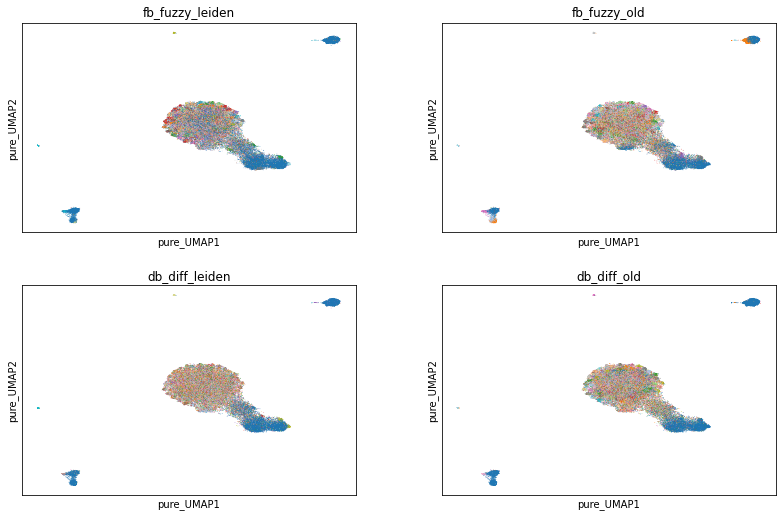

In [24]:
sc.pl.embedding(adata, basis='pure_UMAP', color=['fb_fuzzy_leiden', 'fb_fuzzy_old', 'db_diff_leiden', 'db_diff_old'], legend_loc=None, ncols=2, palette='tab20') 


In [14]:
adata = ct.default_workflow(adata)

In [15]:
adata

AnnData object with n_obs × n_vars = 66834 × 2318
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'db_diff_leiden', 'db_fuzzy_leiden', 'fb_diff_leiden', 'fb_fuzzy_leiden', 'leiden', 'pca_leiden'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'fb_diff_leiden_logreg', 'hvg', 'leiden', 'log1p', 'fb_fuzzy_leiden_colors', 'fb_diff_leiden_colors', 'db_diff_leiden_colors', 'db_fuzzy_leiden_colors', 'pca', 'neighbors', 'umap'
    obsm: 'X_db', 'X_db_PaCMAP', 'X_db_diff_MAP', 'X_db_fuzzy_MAP', 'X_fb', 'X_fb_PaCMAP', 'X_fb_diff_MAP', 'X_fb_fuzzy_MAP', 'X_umap', 'X_pure_umap', 'X_pca', 'X_pca_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [10]:
import umap

adata.obsm['X_pure_umap'] = umap.UMAP(metric='cosine').fit_transform(adata.X)

In [25]:
from topo.spectral import graph_laplacian
from topo.ann import kNN

In [42]:
# kNN graph
knn = kNN(adata.X, metric='cosine')

# Graph laplacian (random walk normalized laplacian)
rw_lap = graph_laplacian(knn)
norm_lap = graph_laplacian(knn, laplacian='symmetric')

# Default scipy symmetric normalized laplacian
from scipy.sparse.csgraph import laplacian
norm_sp_lap = laplacian(knn, normed=True)

# Riemann metric: PCA, UMAP, PCA_UMAP, db_PaCMAP, fb_PaCMAP
embs = [adata.obsm['X_UMAP'],
                   adata.obsm['X_UMAP_on_PCA'], adata.obsm['X_db_PaCMAP'], adata.obsm['X_fb_PaCMAP']]

rmetrics_H = []
for emb in embs:
        rmetrics_H.append(tp.eval.RiemannMetric(emb, rw_lap).get_dual_rmetric())


/home/davi/.local/lib/python3.10/site-packages/topo/plot.py:363: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ellip = Ellipse(pos, width=width, height=height, angle=theta, **kwargs)


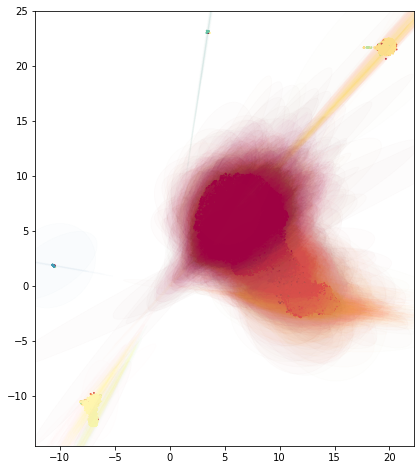

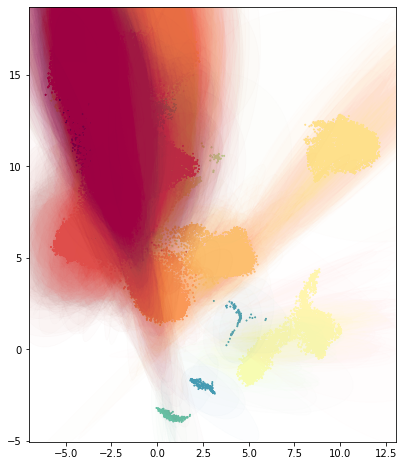

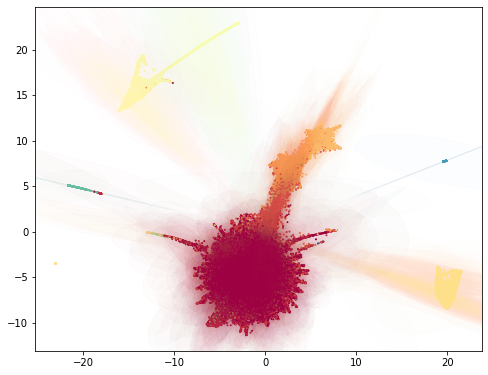

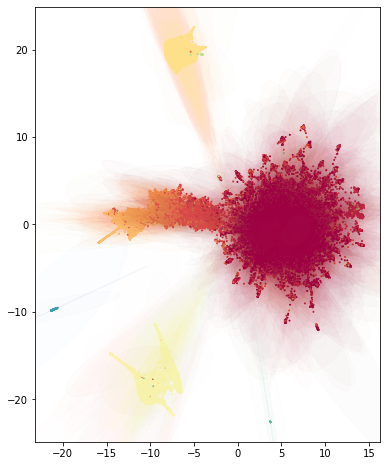

In [45]:
for i in range(0, len(embs)):
    tp.pl.plot_riemann_metric(emb=embs[i], laplacian=rw_lap,
                          H_emb=rmetrics_H[i], labels=adata.obs['pca_leiden'].astype(int),
                          n_plot=2000, std=1, alpha=0.01)

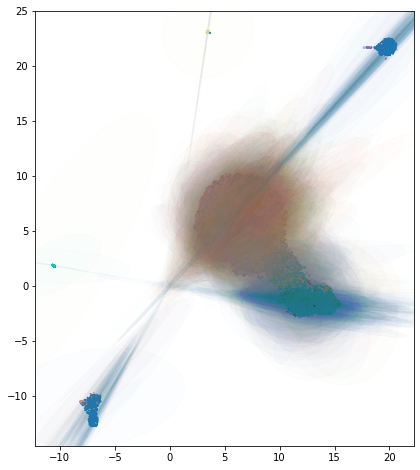

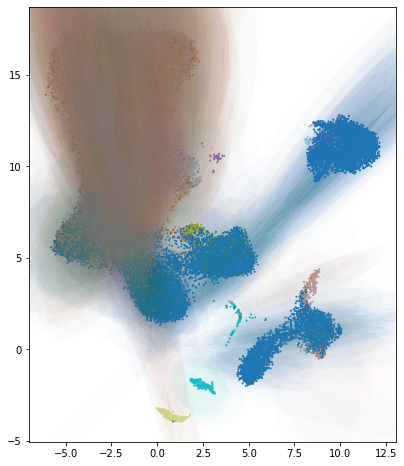

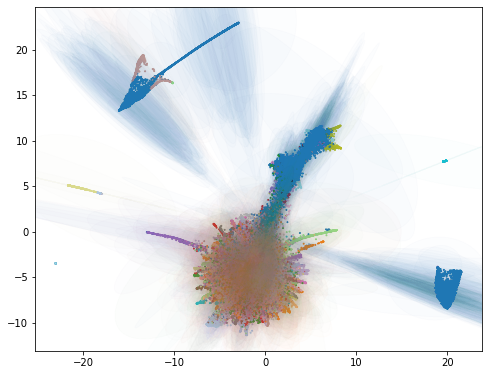

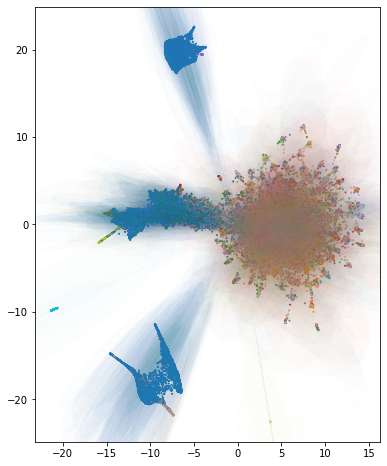

In [46]:
for i in range(0, len(embs)):
    tp.pl.plot_riemann_metric(emb=embs[i], laplacian=rw_lap,
                          H_emb=rmetrics_H[i], labels=adata.obs['db_diff_leiden'].astype(int), cmap='tab20',
                          n_plot=2000, std=1, alpha=0.01)

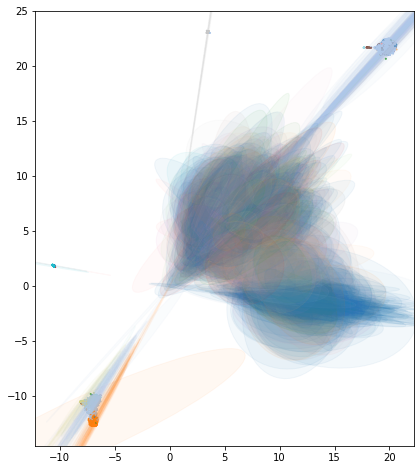

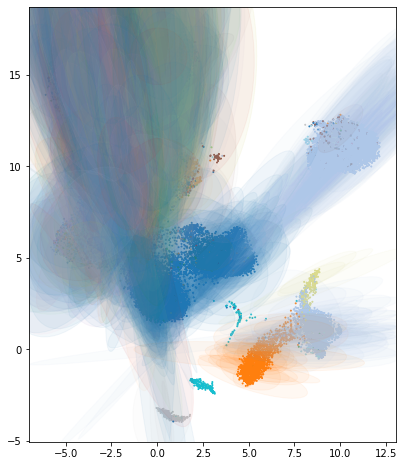

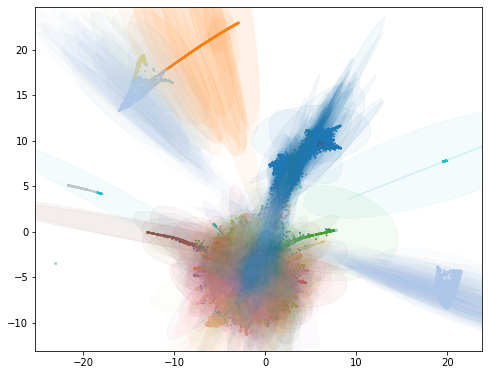

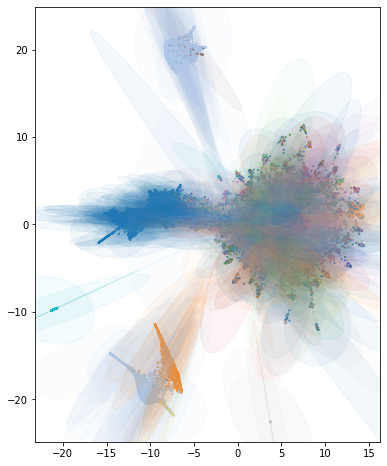

In [47]:
for i in range(0, len(embs)):
    tp.pl.plot_riemann_metric(emb=embs[i], laplacian=rw_lap,
                          H_emb=rmetrics_H[i], labels=adata.obs['db_fuzzy_leiden'].astype(int), cmap='tab20',
                          n_plot=1000, std=1, alpha=0.05)

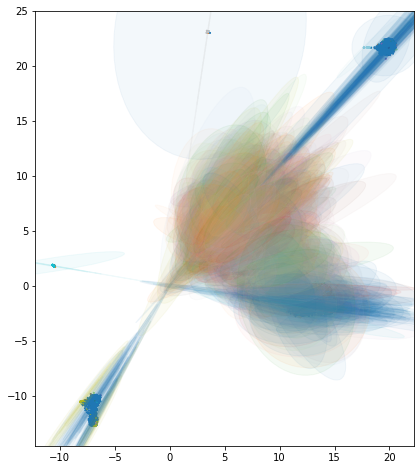

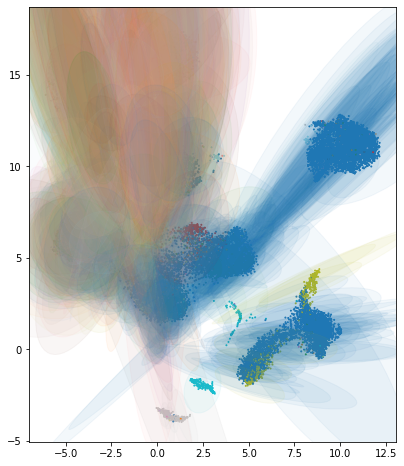

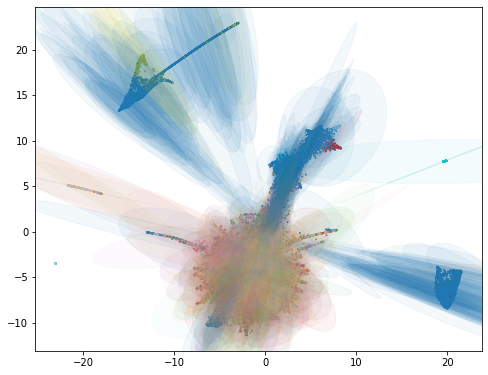

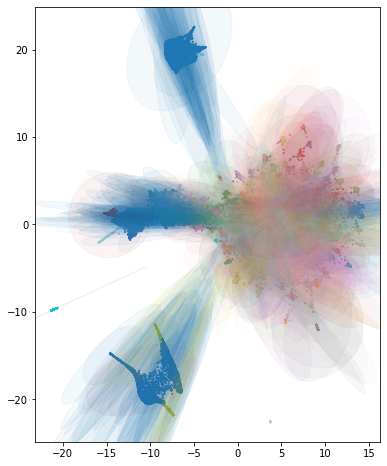

In [48]:
for i in range(0, len(embs)):
    tp.pl.plot_riemann_metric(emb=embs[i], laplacian=rw_lap,
                          H_emb=rmetrics_H[i], labels=adata.obs['fb_diff_leiden'].astype(int), cmap='tab20',
                          n_plot=1000, std=1, alpha=0.05)

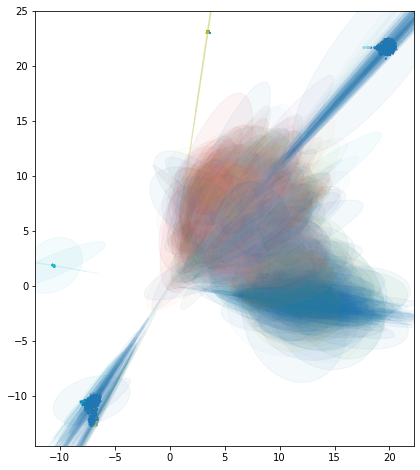

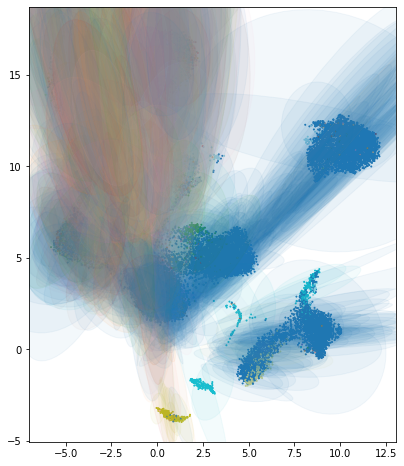

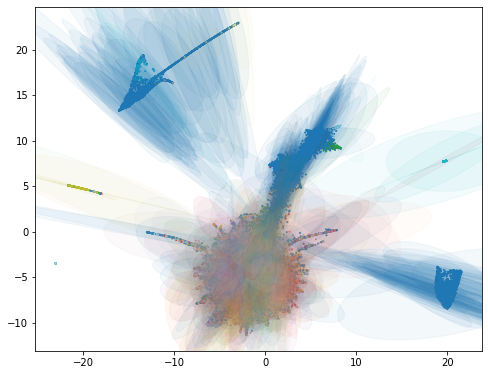

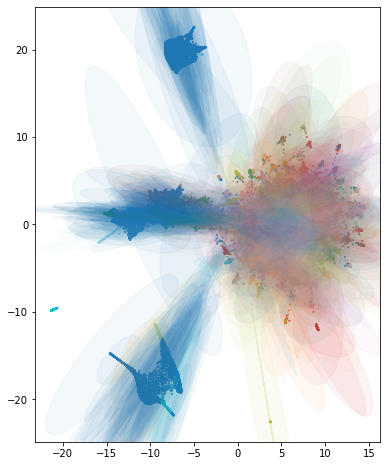

In [49]:
for i in range(0, len(embs)):
    tp.pl.plot_riemann_metric(emb=embs[i], laplacian=rw_lap,
                          H_emb=rmetrics_H[i], labels=adata.obs['fb_fuzzy_leiden'].astype(int), cmap='tab20',
                          n_plot=1000, std=1, alpha=0.05)